In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(os.environ["CUDA_VISIBLE_DEVICES"],torch.cuda.device_count(), torch.cuda.current_device())

2 1 0


In [2]:
import torch
import torchvision
from torchvision import transforms, datasets
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F
from torch import optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from mpl_toolkits.axes_grid1 import make_axes_locatable
import time
import math

print(torch.__version__)
torch.cuda.is_available()

import h5py


1.12.0+cu102


## Data loading

In [3]:
file_list = glob.glob("/home/jupyter-jathurshan/Protein_extracted_data/*.h5")
file_list.sort()
print(len(file_list))


new_list = []
for i in file_list:
    with h5py.File(i, "r") as f:
            # dist_ref = np.array(f.get('dist_ref'))
            sse = np.array(f.get('sse'))
            # seq = np.array(f.get('seq'))
            # mask = np.array(f.get('mask'))
            f.close()
    if len(sse.shape)!=0:
        if sse.shape[-1]!=0:
            new_list.append(i)
print(len(new_list))#,error_list)


c = 0
max_value = 0
min_value = 100000

for i in new_list:
    with h5py.File(i, "r") as f:
            dist_ref = np.expand_dims(np.array(f.get('dist_ref')),axis=0)
    if dist_ref.max()>max_value:
        max_value = dist_ref.max()
    if dist_ref.min()<min_value:
        min_value = dist_ref.min()
print(min_value,max_value)

7555
4918
0.0 227.59543138843227


In [4]:
#15051
file_list = new_list#glob.glob("/home/jupyter-jathurshan/Protein_extracted_data/*.h5")
# file_list.sort()
# print(len(file_list))

train_file_list = file_list[:int(len(file_list)*0.8)]
val_file_list = file_list[int(len(file_list)*0.8):int(len(file_list)*0.9)]
test_file_list = file_list[int(len(file_list)*0.9):]

print(len(train_file_list),len(val_file_list),len(test_file_list))

3934 492 492


In [5]:
def plot_sub_plots(rows,columns,img_list,title_list,cmap = 'inferno'):
    fig, axs = plt.subplots(rows, columns, figsize = (columns*10,rows*10))
    if rows == 1:
        for i in range(len(img_list)):
            im1 = axs[i].imshow(img_list[i],cmap=cmap)
            axs[i].set_title(f"{title_list[i]}")
            plt.colorbar(im1, ax=axs[i])#,shrink = 0.3
    else:
        for i in range(len(img_list)):
            im1 = axs[i//columns][i%columns].imshow(img_list[i],cmap=cmap)
            axs[i//columns][i%columns].set_title(f"{title_list[i]}")
            plt.colorbar(im1, ax=axs[i//columns][i%columns])#,shrink = 0.3)
    # plt.show()
    return fig


In [6]:
import h5py
### Using Distant Ref
class Protein_Dataset(Dataset):
    def __init__(self,file_list, device,pro_len = 64):
      
        self.file_list = file_list
        self.pro_len = pro_len
        self.device = device
        
        self.device = device
        
        print(f"Data_size : {len(self.file_list)}") 
        
    def __len__(self):
        return len(self.file_list )

    def __getitem__(self, idx):
        
        with h5py.File(self.file_list[idx], "r") as f:
            dist_ref = np.array(f.get('dist_ref'))
            dist_ref[np.isnan(dist_ref)] = 0
            sse = np.array(f.get('sse'))
            # seq = np.array(f.get('seq'))
            mask = np.array(f.get('mask'))
            f.close()
        
       
        
        dist_ref = torch.from_numpy(dist_ref).unsqueeze(0).clamp(max=50)
        dist_ref =dist_ref/50
        sse = torch.from_numpy(sse).unsqueeze(0).float()
        # seq = np.array(f.get('seq'))
        mask = torch.from_numpy(mask).squeeze().unsqueeze(0)
        ref_len = dist_ref.shape[-1]
        # print(self.file_list[idx],dist_ref.shape,sse.shape)
        
        # print(self.file_list[idx],dist_ref.shape,mask.shape,sse.shape)
        
#         if dist_ref.shape[-1]<self.pro_len:
#             pad = ((self.pro_len-dist_ref.shape[-1])//2,(self.pro_len-dist_ref.shape[-1])//2,(self.pro_len-dist_ref.shape[-1])//2,(self.pro_len-dist_ref.shape[-1])//2)
#             dist_ref =  F.pad(dist_ref, pad, mode='reflect')
#             mask =  F.pad(mask, pad, mode='constant')
            
#             pad = ((self.pro_len-sse.shape[-1])//2,(self.pro_len-sse.shape[-1])//2)
#             sse =  F.pad(sse, pad, mode='reflect')
#         elif dist_ref.shape[-1]>self.pro_len:
#             crop = transforms.CenterCrop(self.pro_len)
#             dist_ref = crop(dist_ref)
#             mask = crop(mask)
#             crop = transforms.CenterCrop((3,self.pro_len))
#             sse = crop(sse)
         
        if dist_ref.shape[-1]!=self.pro_len:
            crop = transforms.CenterCrop(self.pro_len)
            dist_ref = crop(dist_ref)
            mask = crop(mask)
            crop = transforms.CenterCrop((3,self.pro_len))
            sse = crop(sse)
           
        
#         
        return dist_ref.to(self.device).float(), mask.to(self.device).float(), sse.to(self.device).float(),ref_len

In [7]:
train_dataset = Protein_Dataset(train_file_list, device = device) 
val_dataset = Protein_Dataset(val_file_list, device = device)

Data_size : 3934
Data_size : 492


In [8]:
train_data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_data_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)

torch.Size([32, 1, 64, 64]) torch.Size([32, 1, 64, 64]) torch.Size([32, 1, 3, 64]) tensor([274, 256, 413, 401, 100, 140,  74, 232, 238, 185, 360, 350, 147, 127,
        263, 209,  52, 158, 268, 176, 101, 102, 321, 194,  81, 193, 602, 281,
        361, 283, 231, 162])



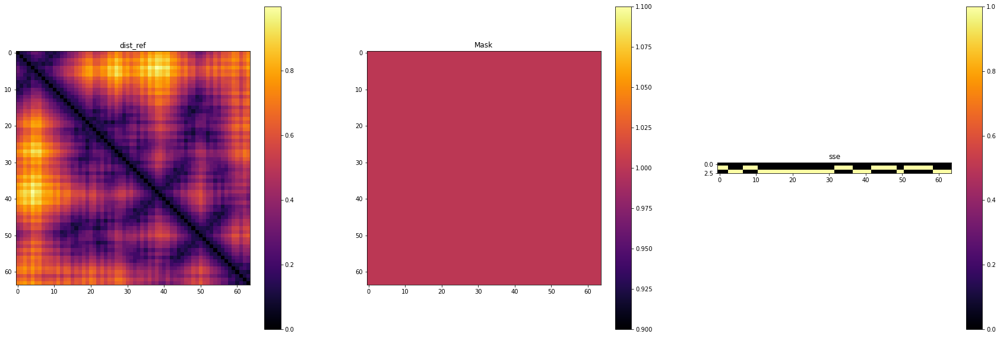

In [9]:
dist_ref,mask,sse,ref_len   = next(iter(train_data_loader))

print(dist_ref.shape,mask.shape,sse.shape,ref_len) 
ind = 0
img_list = [dist_ref[ind].squeeze().detach().cpu().numpy(),
           mask[ind].squeeze().detach().cpu().numpy(),
           sse[ind].squeeze().detach().cpu().numpy(),
           ]

title_list = ['dist_ref','Mask','sse']
plot_sub_plots(1,3,img_list,title_list,cmap = 'inferno')
print('')

## Model

In [10]:
import torch
from torch.autograd import Function

class VectorQuantization(Function):
    @staticmethod
    def forward(ctx, inputs, codebook):
        with torch.no_grad():
            embedding_size = codebook.size(1)
            inputs_size = inputs.size()
            inputs_flatten = inputs.view(-1, embedding_size)

            codebook_sqr = torch.sum(codebook ** 2, dim=1)
            inputs_sqr = torch.sum(inputs_flatten ** 2, dim=1, keepdim=True)

            # Compute the distances to the codebook
            distances = torch.addmm(codebook_sqr + inputs_sqr,
                inputs_flatten, codebook.t(), alpha=-2.0, beta=1.0)

            _, indices_flatten = torch.min(distances, dim=1)
            indices = indices_flatten.view(*inputs_size[:-1])
            ctx.mark_non_differentiable(indices)

            return indices

    @staticmethod
    def backward(ctx, grad_output):
        raise RuntimeError('Trying to call `.grad()` on graph containing '
            '`VectorQuantization`. The function `VectorQuantization` '
            'is not differentiable. Use `VectorQuantizationStraightThrough` '
            'if you want a straight-through estimator of the gradient.')

class VectorQuantizationStraightThrough(Function):
    @staticmethod
    def forward(ctx, inputs, codebook):
        indices = vq(inputs, codebook)
        indices_flatten = indices.view(-1)
        ctx.save_for_backward(indices_flatten, codebook)
        ctx.mark_non_differentiable(indices_flatten)

        codes_flatten = torch.index_select(codebook, dim=0,
            index=indices_flatten)
        codes = codes_flatten.view_as(inputs)

        return (codes, indices_flatten)

    @staticmethod
    def backward(ctx, grad_output, grad_indices):
        grad_inputs, grad_codebook = None, None

        if ctx.needs_input_grad[0]:
            # Straight-through estimator
            grad_inputs = grad_output.clone()
        if ctx.needs_input_grad[1]:
            # Gradient wrt. the codebook
            indices, codebook = ctx.saved_tensors
            embedding_size = codebook.size(1)

            grad_output_flatten = (grad_output.contiguous()
                                              .view(-1, embedding_size))
            grad_codebook = torch.zeros_like(codebook)
            grad_codebook.index_add_(0, indices, grad_output_flatten)

        return (grad_inputs, grad_codebook)

vq = VectorQuantization.apply
vq_st = VectorQuantizationStraightThrough.apply
__all__ = [vq, vq_st]

In [11]:
class VQEmbedding(nn.Module):
    def __init__(self, K, D):
        super().__init__()
        self.embedding = nn.Embedding(K, D)
        self.embedding.weight.data.uniform_(-1./K, 1./K)

    def forward(self, z_e_x):
        z_e_x_ = z_e_x.permute(0, 2, 3, 1).contiguous()
        latents = vq(z_e_x_, self.embedding.weight)
        return latents

    def straight_through(self, z_e_x):
        z_e_x_ = z_e_x.permute(0, 2, 3, 1).contiguous()
        z_q_x_, indices = vq_st(z_e_x_, self.embedding.weight.detach())
        z_q_x = z_q_x_.permute(0, 3, 1, 2).contiguous()

        z_q_x_bar_flatten = torch.index_select(self.embedding.weight,
            dim=0, index=indices)
        z_q_x_bar_ = z_q_x_bar_flatten.view_as(z_e_x_)
        z_q_x_bar = z_q_x_bar_.permute(0, 3, 1, 2).contiguous()

        return z_q_x, z_q_x_bar

class ResBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReLU(True),
            nn.Conv2d(dim, dim, 3, 1, 1),
            nn.BatchNorm2d(dim),
            nn.ReLU(True),
            nn.Conv2d(dim, dim, 1),
            nn.BatchNorm2d(dim)
        )

    def forward(self, x):
        return x + self.block(x)    

class VectorQuantizedVAE(nn.Module):
    def __init__(self, input_dim, dim, K=512):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(input_dim, dim, 4, 2, 1),
            nn.BatchNorm2d(dim),
            nn.ReLU(True),
            nn.Conv2d(dim, dim, 4, 2, 1),
            ResBlock(dim),
            ResBlock(dim),
        )

        self.codebook = VQEmbedding(K, dim)

        self.decoder = nn.Sequential(
            ResBlock(dim),
            ResBlock(dim),
            nn.ReLU(True),
            nn.ConvTranspose2d(dim, dim, 4, 2, 1),
            nn.BatchNorm2d(dim),
            nn.ReLU(True),
            nn.ConvTranspose2d(dim, input_dim, 4, 2, 1),
            # nn.Tanh()
        )

        # self.apply(weights_init)

    def encode(self, x):
        z_e_x = self.encoder(x)
        latents = self.codebook(z_e_x)
        return latents

    def decode(self, latents):
        z_q_x = self.codebook.embedding(latents).permute(0, 3, 1, 2)  # (B, D, H, W)
        x_tilde = self.decoder(z_q_x)
        return x_tilde

    def forward(self, x,task = 'Enc-Dec'):
        if task == 'Enc-Dec':
            z_e_x = self.encoder(x)
            z_q_x_st, z_q_x = self.codebook.straight_through(z_e_x)
            # print(z_q_x_st.shape)
            x_tilde = self.decoder(z_q_x_st)
            return x_tilde
        elif task == 'Enc':
            z_e_x = self.encoder(x)
            z_q_x_st, z_q_x = self.codebook.straight_through(z_e_x)
            return z_q_x_st
        elif task == 'Dec':
            x_tilde = self.decoder(x)
            return x_tilde


In [12]:
# encoder = CNN_Encoder(ngf = 16).to(device)
# decoder = CNN_Decoder(lat_chan=32).to(device)
Net = VectorQuantizedVAE(input_dim=1,dim=256).to(device)

out = Net(dist_ref)
#[32, 256, 16, 16])
print(dist_ref.shape,out.shape)

torch.Size([32, 1, 64, 64]) torch.Size([32, 1, 64, 64])


In [13]:
criterion = nn.L1Loss()
lr  = 0.001   
beta_1 = 0.9
beta_2 = 0.999
n_epochs = 500 
opt =  torch.optim.Adam(Net.parameters(), lr=lr, betas=(beta_1, beta_2))

In [14]:
is_wandb = True
if is_wandb:
    import wandb
    wandb.init(project="diff_protein_gen", entity="jathurshan_0330")
    wandb.run.name = "VQVAE Training Using Distoref"
    wandb.run.save()
    # "Finetuning only classification head Ki67 using SIMCLR Pretrained Model"
    exp_path = f"./model_checkpoints/{wandb.run.name}"
    if not os.path.exists(exp_path):
        os.mkdir(exp_path)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: jathurshan_0330. Use `wandb login --relogin` to force relogin
/usr/bin/nvidia-modprobe: unrecognized option: "-s"

ERROR: Invalid commandline, please run `/usr/bin/nvidia-modprobe --help` for usage information.


/usr/bin/nvidia-modprobe: unrecognized option: "-s"

ERROR: Invalid commandline, please run `/usr/bin/nvidia-modprobe --help` for usage information.




wandb: WARNING Calling wandb.run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


In [15]:
def recon_loss(x_hat,x):
    criterion = nn.L1Loss()
    return criterion(x_hat,x)

class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count if self.count != 0 else 0

In [16]:
def train(Net,opt,data_loader,is_wandb=False,verbose_freq = 500,is_verbose = False):
    Net.train()
    
    batch_time = AverageMeter()
    data_time = AverageMeter()
    train_losses = AverageMeter()
    end = time.time()
    
    for batch_idx, (x,m,_,_ ) in enumerate(data_loader): 
        data_time.update(time.time() - end)
        
        opt.zero_grad()
        # c_hat = encoder(x)
        # x_hat = decoder(c_hat)
        x_hat = Net(x)
        
        loss = recon_loss(x_hat*m,x*m)
        
        loss.backward()
        opt.step()
        
        train_losses.update(loss.data.item())
        batch_time.update(time.time() - end)
        end = time.time()
        
        if is_verbose:
            if (batch_idx+1) % verbose_freq == 0:
                msg = 'Epoch: [{0}/{3}][{1}/{2}]\t' \
                      'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t' \
                      'Speed {speed:.1f} samples/s\t' \
                      'Data {data_time.val:.3f}s ({data_time.avg:.3f}s)\t' \
                      'Loss {train_loss.val:.5f} ({train_loss.avg:.5f})\t'.format(
                          epoch_idx+1, batch_idx,len(data_loader), n_epochs , batch_time=batch_time,
                          speed=x.size(0)/batch_time.val,
                          data_time=data_time, train_loss=train_losses)
                print(msg)
        
        if is_wandb:
            wandb.log({"batch_loss": loss.data.item()})
    
    
    if is_wandb:
            wandb.log({"train_epoch_loss": train_losses.avg})
            wandb.log({"training time/Iter": batch_time.sum/len(data_loader)})
    
    
    # print(f"Evaluation   Epoch : {epoch_idx+1}  =====================>")
    if is_verbose:
        print(f"Training Epoch Loss: {train_losses.avg}")
    return train_losses.avg
        
        
def validate(Net,data_loader,is_wandb=False,is_verbose = False):
    Net.eval()
    
    val_losses = AverageMeter()
    
    
    with torch.no_grad():
        for batch_idx, (x,m,_,_ ) in enumerate(data_loader): 
            
            x_hat = Net(x)

            loss = recon_loss(x_hat*m,x*m) 
            
            val_losses.update(loss.data.item())
            
            
    dist_ref,mask,sse,ref_len   = next(iter(data_loader))
    with torch.no_grad():
        x_hat = Net(x)
    # print(dist_ref.shape,mask.shape,sse.shape,ref_len) 
    # ind = 0
    img_list = [dist_ref[1].squeeze().detach().cpu().numpy(),
                x_hat[1].squeeze().detach().cpu().numpy(),
                mask[1].squeeze().detach().cpu().numpy(),
                sse[1].squeeze().detach().cpu().numpy(),
                dist_ref[3].squeeze().detach().cpu().numpy(),
                x_hat[3].squeeze().detach().cpu().numpy(),
                mask[3].squeeze().detach().cpu().numpy(),
                sse[3].squeeze().detach().cpu().numpy(),
                dist_ref[6].squeeze().detach().cpu().numpy(),
                x_hat[6].squeeze().detach().cpu().numpy(),
                mask[6].squeeze().detach().cpu().numpy(),
                sse[6].squeeze().detach().cpu().numpy()]
                
    title_list = ['dist_ref','Pred','Mask','sse',
                  'dist_ref','Pred','Mask','sse',
                  'dist_ref','Pred','Mask','sse']
    fig = plot_sub_plots(3,4,img_list,title_list,cmap = 'inferno')
    if is_wandb:
            wandb.log({"examples": wandb.Image(fig)})
            
    if is_wandb:
            wandb.log({"val_epoch_loss": val_losses.avg})
    
    
    # print(f"Evaluation   Epoch : {epoch_idx+1}  =====================>")
    if is_verbose:
        print(f"Val Epoch Loss: {val_losses.avg}")
    return val_losses.avg

In [17]:
# exp_path = "./model_checkpoints/autoencoder_MNIST/"
# if not os.path.exists(exp_path):
#     os.mkdir(exp_path)

Training ==================

/opt/tljh/user/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Text(0.5, 1.0, 'Val Loss')

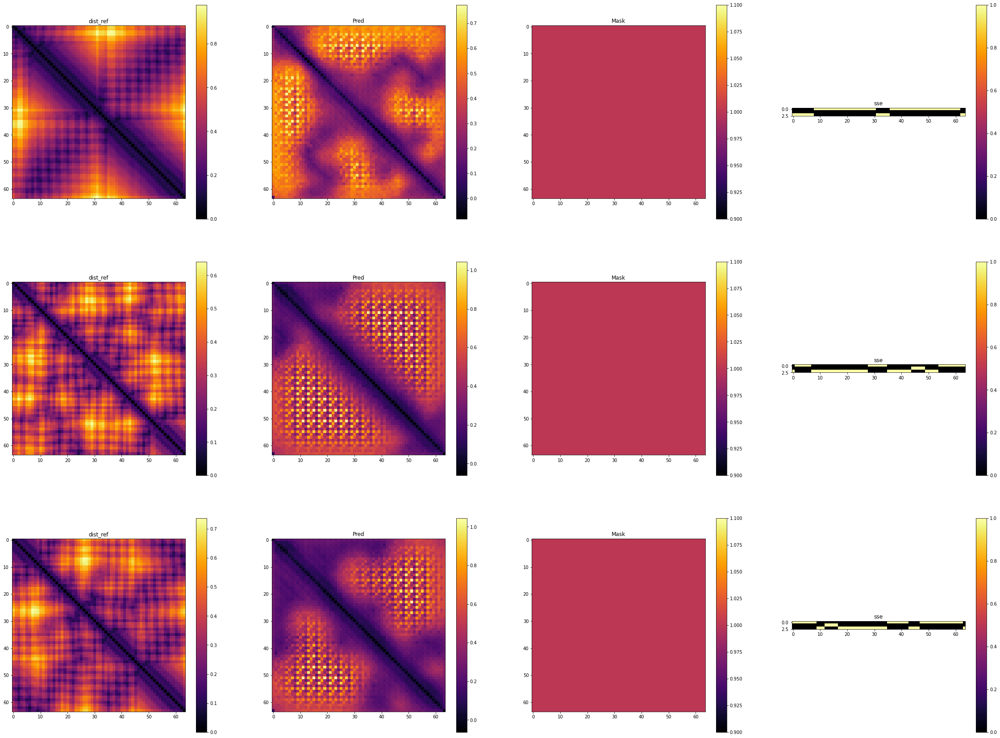

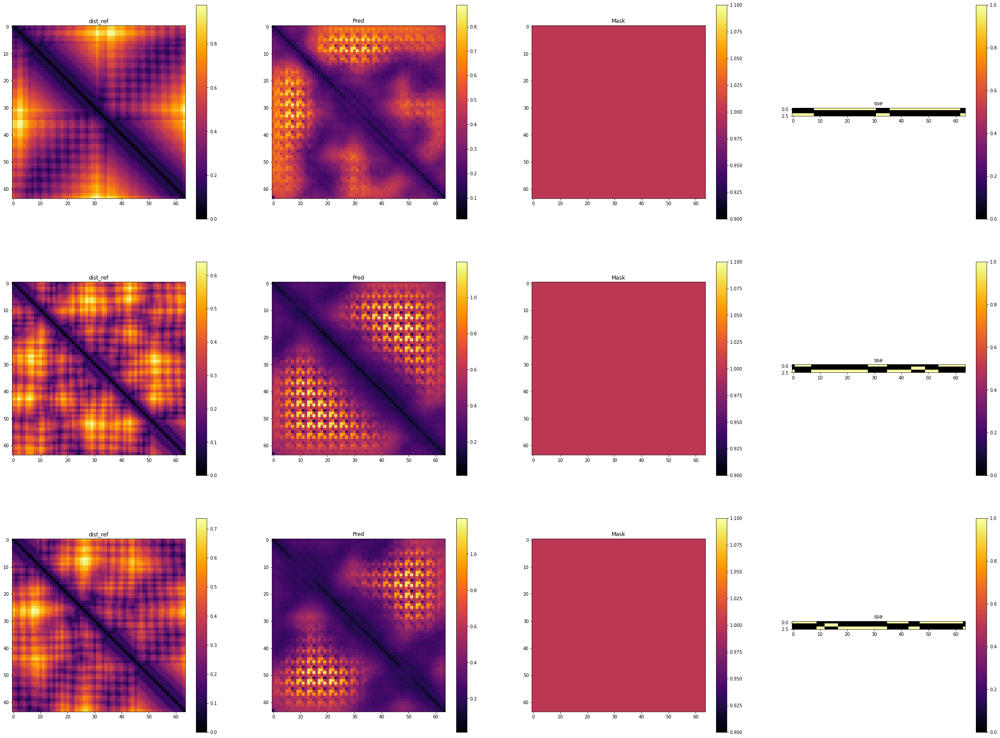

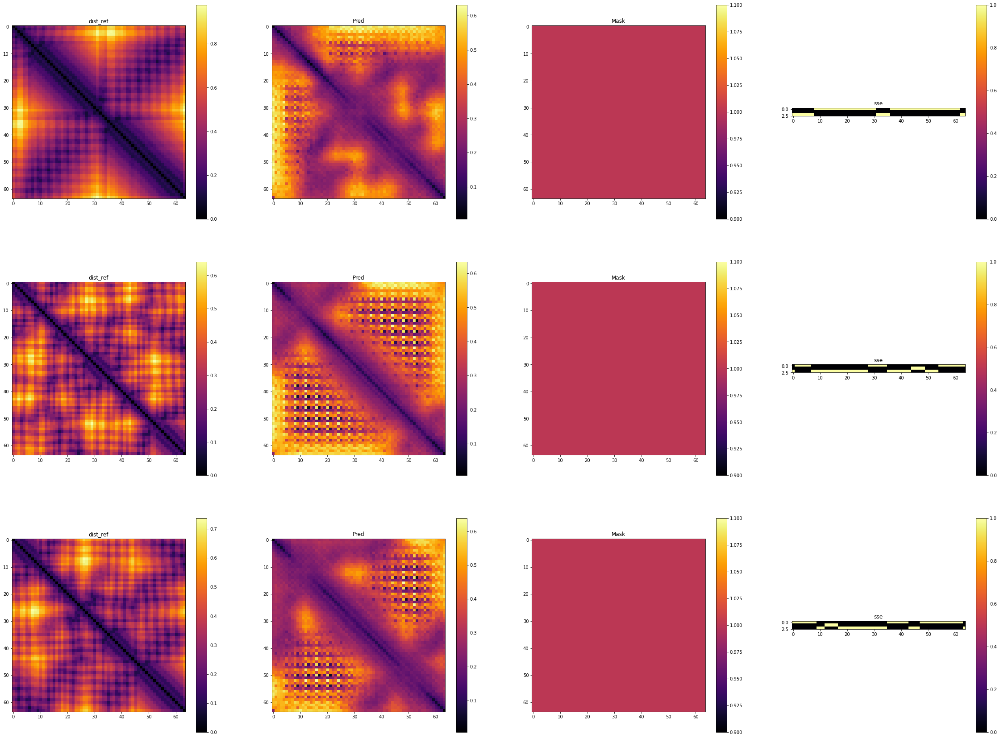

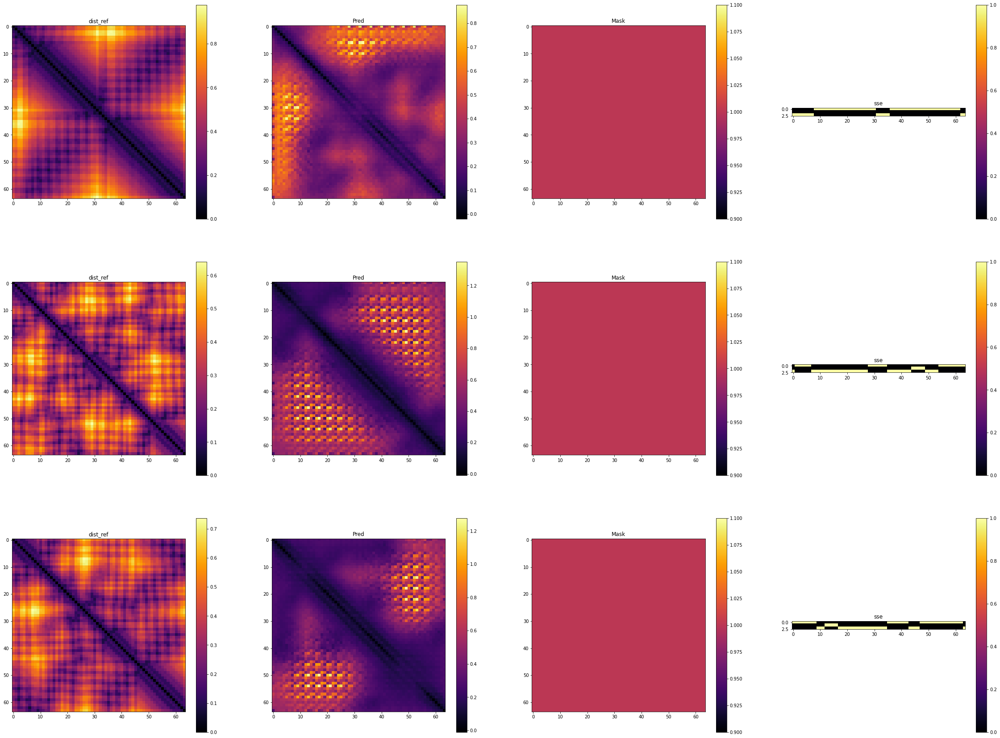

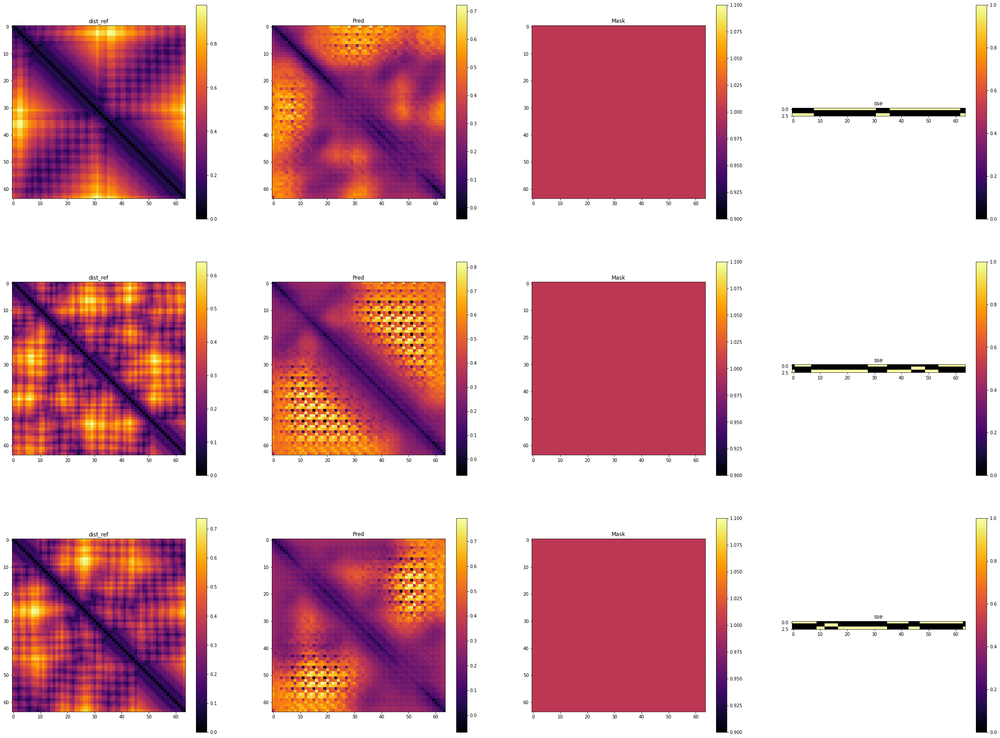

...

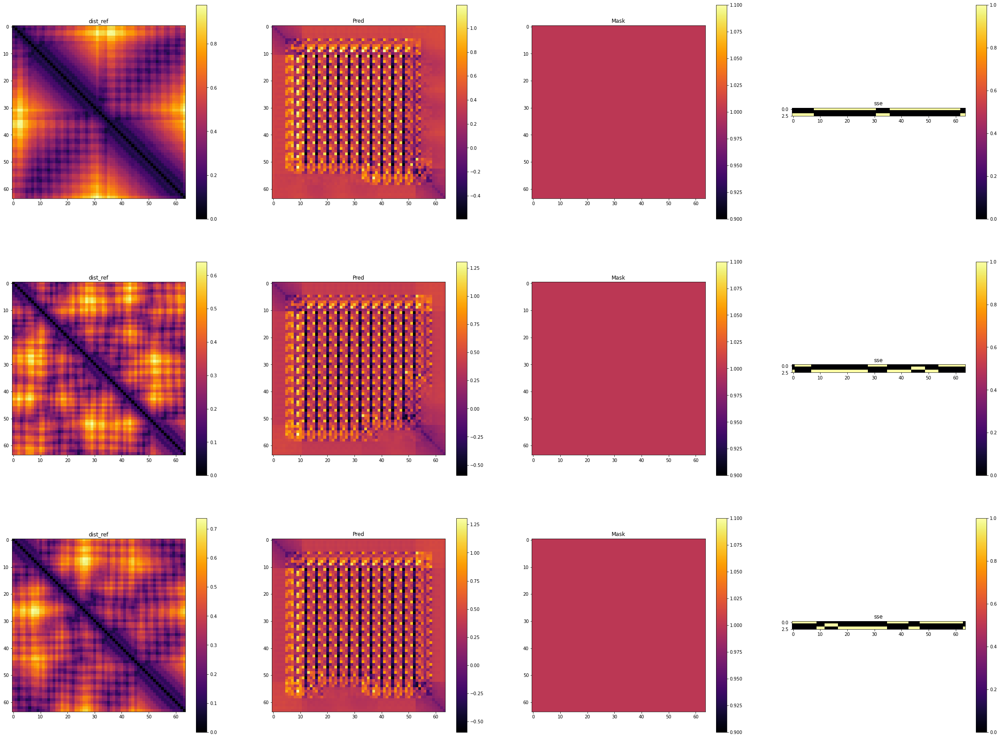

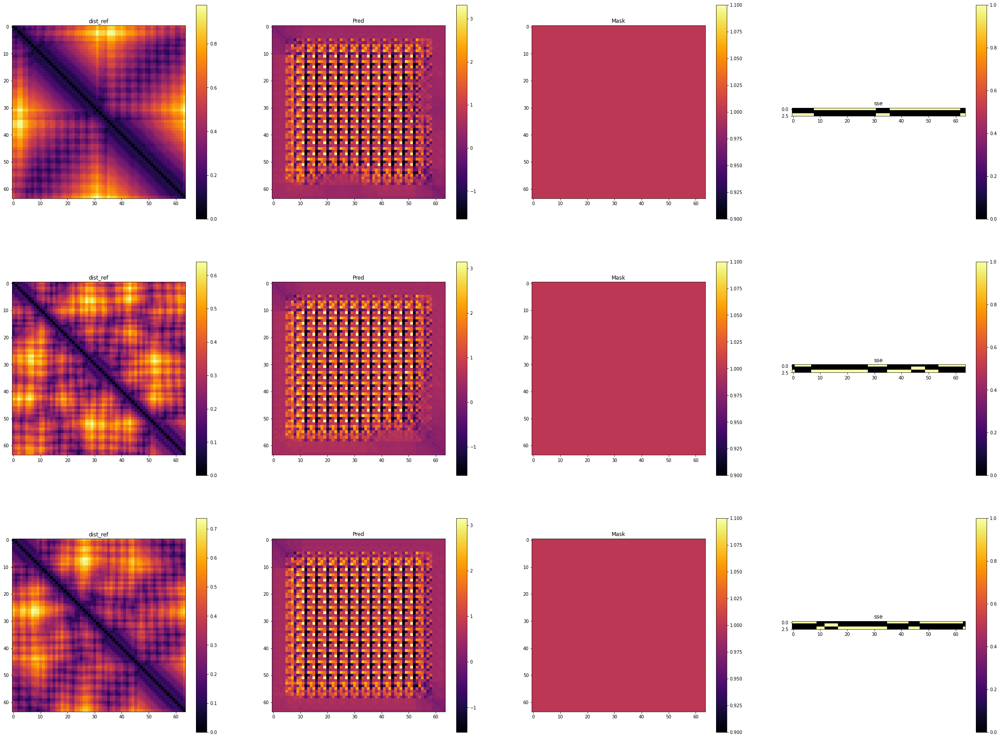

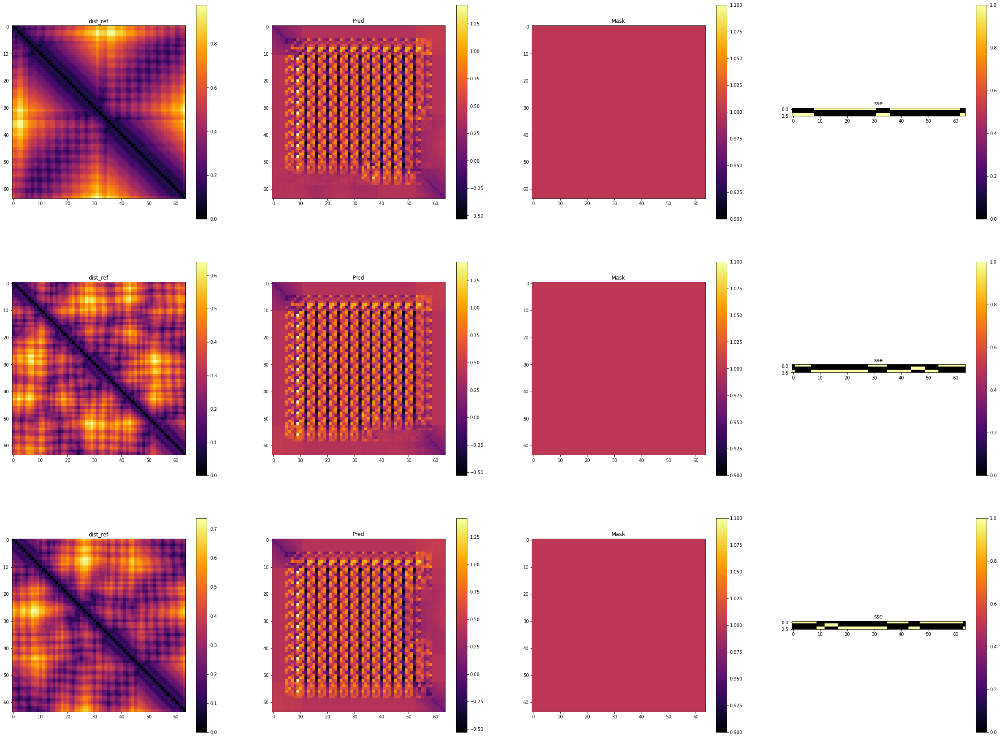

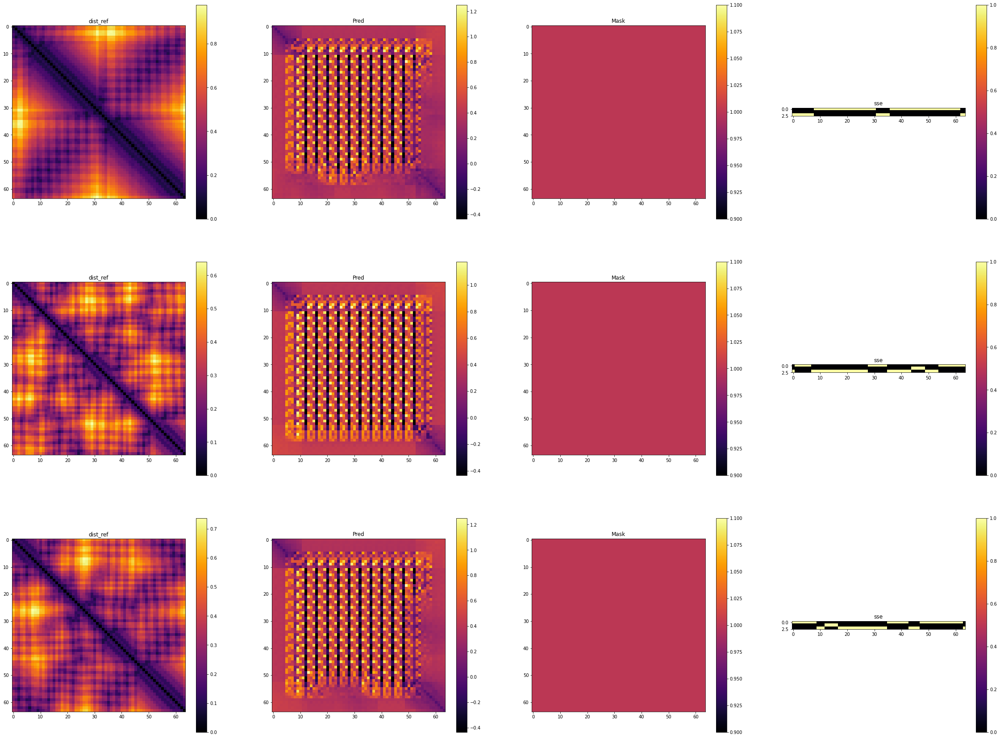

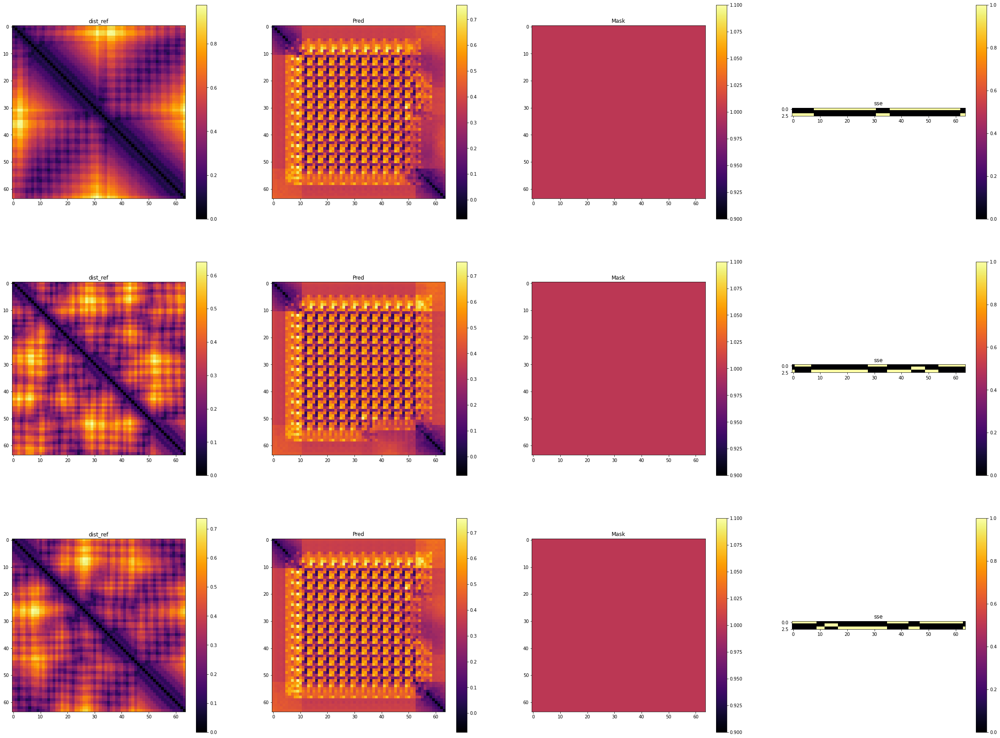

In [ ]:
val_best_loss = 10000000
train_loss_list = []
val_loss_list = []

# if not os.path.exists(exp_path):
#     os.mkdir(exp_path)
print("Training ", end='')
for epoch_idx in range(n_epochs):
    print('=', end='')
    # print(f"Training Epoch : [{epoch_idx+1}/{n_epochs}]===============================================================================")
    
    train_loss = train(Net,opt,train_data_loader,is_wandb=is_wandb)    
    val_losses = validate(Net,val_data_loader,is_wandb=is_wandb) 

    train_loss_list.append(train_loss)
    val_loss_list.append(val_losses)
    if (val_losses < val_best_loss): 
        val_best_loss = val_losses
        # print("Saving Best Model =======================================>")
        torch.save(Net, f'{exp_path}/VQVAE_dist.pth.tar')
        # torch.save(decoder, f'{exp_path}/decoder_dist.pth.tar')
    
    
plt.figure()
plt.plot(train_loss_list)
plt.title("Train Loss")

plt.figure()
plt.plot(val_loss_list)
plt.title("Val Loss")

## Latent Space Visualization

In [ ]:
from sklearn.manifold import TSNE

In [27]:
enc_path = f'{exp_path}/encoder_2.pth.tar'
encoder = torch.load(enc_path).to(device)
encoder.eval()
print(sum([np.prod(p.size()) for p in encoder.parameters()]))

8496


In [31]:
dec_path = f'{exp_path}/decoder_2.pth.tar'
decoder = torch.load(dec_path).to(device)
decoder.eval()
print(sum([np.prod(p.size()) for p in decoder.parameters()]))

67713


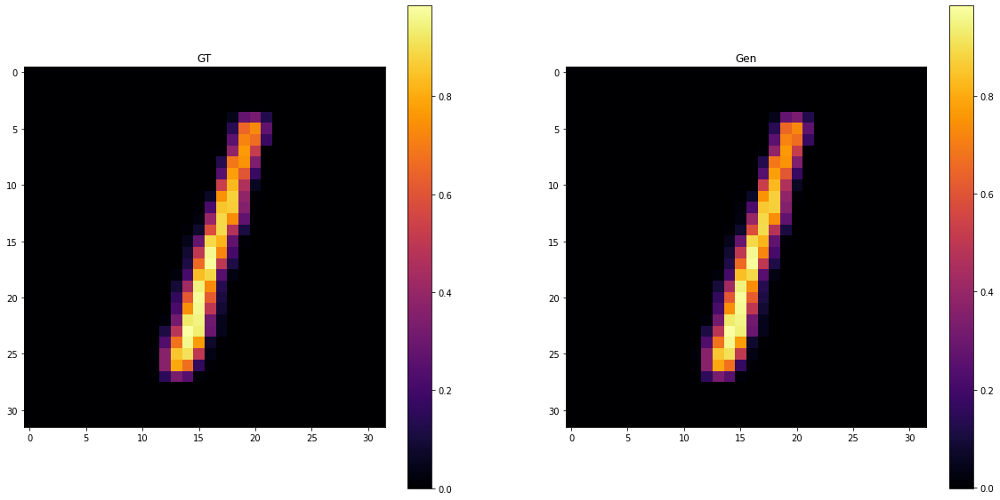

In [33]:
def plot_sub_plots(rows,columns,img_list,title_list,cmap = 'inferno'):
    fig, axs = plt.subplots(rows, columns, figsize = (columns*10,rows*10))
    if rows == 1:
        for i in range(len(img_list)):
            im1 = axs[i].imshow(img_list[i],cmap=cmap)
            axs[i].set_title(f"{title_list[i]}")
            plt.colorbar(im1, ax=axs[i])#,shrink = 0.3
    else:
        for i in range(len(img_list)):
            im1 = axs[i//columns][i%columns].imshow(img_list[i],cmap=cmap)
            axs[i//columns][i%columns].set_title(f"{title_list[i]}")
            plt.colorbar(im1, ax=axs[i//columns][i%columns])#,shrink = 0.3)
    plt.show()
    # return fig

for batch_idx, (x,label) in enumerate(val_data_loader): 
    c_hat = encoder(x.to(device))
    x_hat = decoder(c_hat)
    break
    
    
plot_sub_plots(1,2,[x[2].detach().squeeze().cpu().numpy(),x_hat[2].detach().squeeze().cpu().numpy()],['GT','Gen'])

In [28]:
for batch_idx, (x,label) in enumerate(val_data_loader): 
    c_hat = encoder(x.to(device))
    if batch_idx==0:
        features = c_hat
        label_list = label
    else:
        features = torch.cat((features,c_hat),axis = 0)
        label_list = torch.cat((label_list,label),axis = 0)
print(features.shape,label_list.shape)

features = features.flatten(start_dim = 1).detach().cpu().numpy()
label_list = label_list.detach().cpu().numpy()

torch.Size([10000, 32, 8, 8]) torch.Size([10000])


In [29]:
tsne = TSNE(random_state = 42, n_components=2,verbose=0, perplexity=40, n_iter=300).fit_transform(features)

/home/jupyter-jathurshan/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/jupyter-jathurshan/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


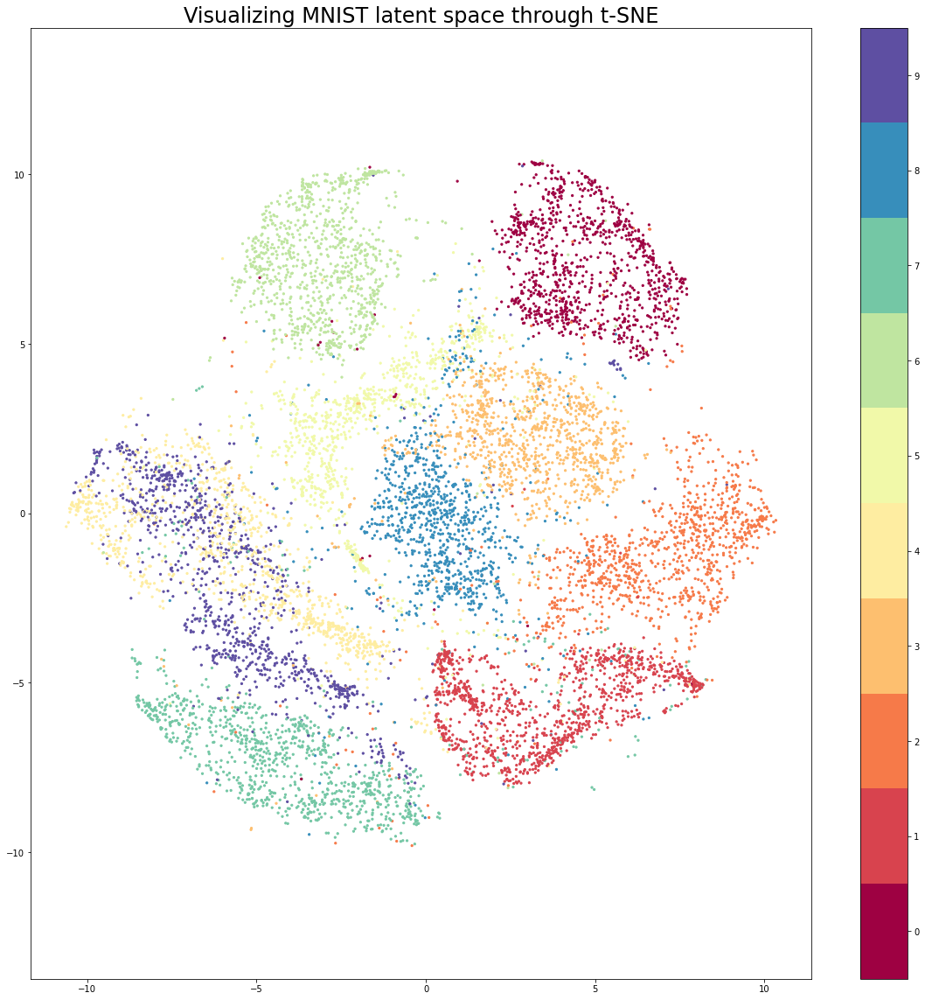

In [30]:
plt.figure(figsize = (20,20))
plt.scatter(tsne[:, 0], tsne[:, 1], s= 5, c=label_list, cmap='Spectral')
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('Visualizing MNIST latent space through t-SNE', fontsize=24);